In [1]:
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from matplotlib import animation
from IPython.display import HTML

In [2]:
import matplotlib
matplotlib.rcParams["animation.embed_limit"] = 50 * 1024 * 1024

In [3]:
# Checkpoint to read.
checkpoint = "../resources/dataset/scene_0/checkpoints/checkpoint_0000.npz"
# Load the checkpoint data.
data = np.load(checkpoint)
# Extract the data.
alpha = data["alpha"]
pressure = data["pressure"]
velocity = data["velocity"]
# Define the number of steps and pressure array
steps = pressure.shape[0]

Alpha Animation:   0%|          | 0/512 [00:00<?, ?frame/s]

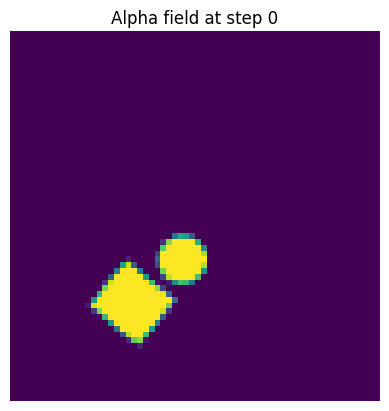

In [4]:
# precompute global min/max for consistent scaling
alpha_min, alpha_max = alpha.min(), alpha.max()

# tqdm for alpha animation
pbar_alpha = tqdm(total=steps, desc="Alpha Animation", unit="frame")

def update_alpha(frame):
    ax3.clear()
    im3 = ax3.imshow(
        alpha[frame].T,
        cmap="viridis",
        vmin=alpha_min,
        vmax=alpha_max,
        interpolation="nearest"
    )
    ax3.set_title(f"Alpha field at step {frame}")
    ax3.axis("off")
    pbar_alpha.update(1)
    if frame == steps - 1:
        pbar_alpha.close()
    return [im3]

fig3, ax3 = plt.subplots()
ani_alpha = animation.FuncAnimation(
    fig3,
    update_alpha,
    frames=range(steps),
    interval=1000 / 60,  # 60 fps
    blit=False,
    repeat=True,
)

# display in notebook
HTML(ani_alpha.to_jshtml())

Velocity Animation:   0%|          | 0/512 [00:00<?, ?frame/s]

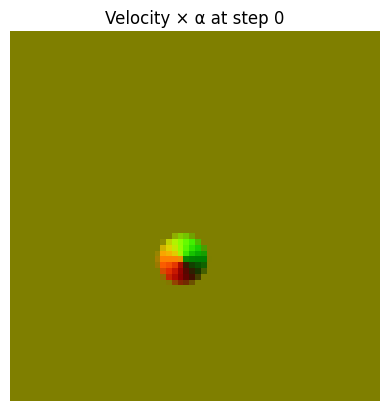

In [5]:
# precompute global max magnitude for normalization (scale velocity by alpha)
vel_mag = np.linalg.norm(velocity * alpha[..., None], axis=-1)
vel_max = vel_mag.max()

# tqdm for velocity animation
pbar_vel = tqdm(total=steps, desc="Velocity Animation", unit="frame")

def update_vel(frame):
    ax2.clear()
    # extract and scale by alpha
    vx = velocity[frame, ..., 0].T * alpha[frame].T
    vy = velocity[frame, ..., 1].T * alpha[frame].T
    # normalize to [-1, 1]
    vx_n = vx / vel_max
    vy_n = vy / vel_max
    # map to [0,1] for RGB channels: x→red, y→green
    R = (vx_n + 1) / 2
    G = (vy_n + 1) / 2
    B = np.zeros_like(R)
    img = np.stack([R, G, B], axis=-1)
    im2 = ax2.imshow(img, interpolation='nearest')
    ax2.set_title(f'Velocity × α at step {frame}')
    ax2.axis('off')
    pbar_vel.update(1)
    if frame == steps - 1:
        pbar_vel.close()
    return [im2]

fig2, ax2 = plt.subplots()
ani_vel = animation.FuncAnimation(
    fig2,
    update_vel,
    frames=range(steps),
    interval=1000 / 60,  # 60 fps
    blit=False,
    repeat=True,
)

# display in notebook
HTML(ani_vel.to_jshtml())

Animation Progress:   0%|          | 0/512 [00:00<?, ?step/s]

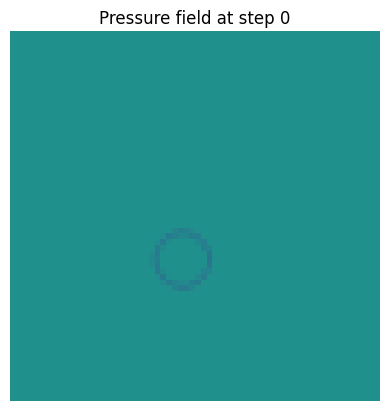

In [6]:
# Tqdm progress bar for the simulation
pbar = tqdm(total=steps, desc="Animation Progress", unit="step")

# Generate the animation for the pressure field.
def update(frame):
    ax.clear()
    im = ax.imshow(
        pressure[frame].T,
        interpolation='nearest',
        vmin=-10.0,
        vmax=10.0
    )
    ax.set_title(f'Pressure field at step {frame}')
    ax.axis('off')
    # Update the progress bar
    pbar.update(1)
    # Close the progress bar when done
    if frame == steps - 1:
        pbar.close()
    return [im]

fig, ax = plt.subplots()

# Wrap the animation generation with tqdm for progress tracking
ani = animation.FuncAnimation(
    fig,
    update,
    frames=range(steps),
    interval=1000 / 60,
    blit=False,
    repeat=True,
)

# Display the animation in the notebook
HTML(ani.to_jshtml())